In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/movielens-100k-dataset/ml-100k/u.occupation
/kaggle/input/movielens-100k-dataset/ml-100k/u1.base
/kaggle/input/movielens-100k-dataset/ml-100k/u.info
/kaggle/input/movielens-100k-dataset/ml-100k/u4.test
/kaggle/input/movielens-100k-dataset/ml-100k/u.item
/kaggle/input/movielens-100k-dataset/ml-100k/README
/kaggle/input/movielens-100k-dataset/ml-100k/u1.test
/kaggle/input/movielens-100k-dataset/ml-100k/ua.test
/kaggle/input/movielens-100k-dataset/ml-100k/u.data
/kaggle/input/movielens-100k-dataset/ml-100k/u5.test
/kaggle/input/movielens-100k-dataset/ml-100k/mku.sh
/kaggle/input/movielens-100k-dataset/ml-100k/u5.base
/kaggle/input/movielens-100k-dataset/ml-100k/u.user
/kaggle/input/movielens-100k-dataset/ml-100k/ub.base
/kaggle/input/movielens-100k-dataset/ml-100k/u4.base
/kaggle/input/movielens-100k-dataset/ml-100k/u2.test
/kaggle/input/movielens-100k-dataset/ml-100k/ua.base
/kaggle/input/movielens-100k-dataset/ml-100k/u3.test
/kaggle/input/movielens-100k-dataset/ml-100k/u.

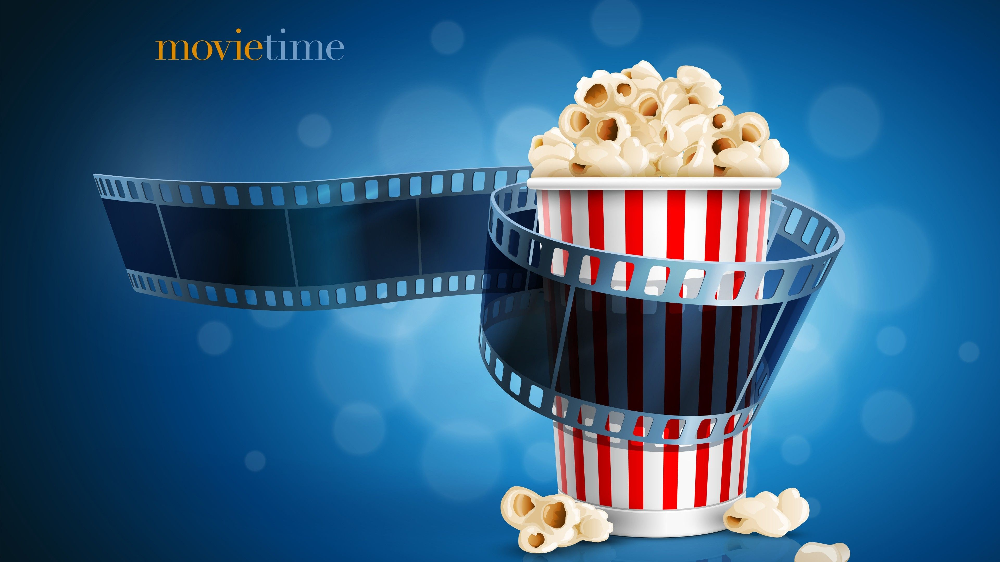
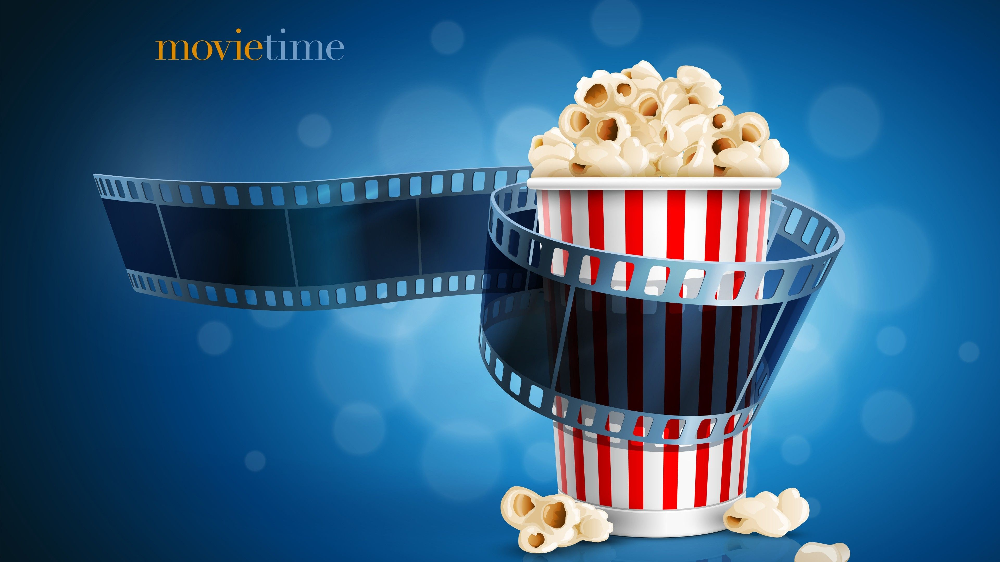

In [3]:
pd.options.display.max_columns = None

In [4]:
# Adjust paths if needed, but on Kaggle they’ll usually be under '/kaggle/input/...'
ratings = pd.read_csv(
    '/kaggle/input/movielens-100k-dataset/ml-100k/u.data',
    sep='\t',
    names=['user_id','movie_id','rating','timestamp']
)
movies = pd.read_csv(
    '/kaggle/input/movielens-100k-dataset/ml-100k/u.item',
    sep='|',
    encoding='latin-1',
    names=[
        'movie_id','title','release_date','video_release_date','IMDb_URL',
        'genre_unknown','genre_action','genre_adventure','genre_animation',
        'genre_children','genre_comedy','genre_crime','genre_documentary',
        'genre_drama','genre_fantasy','genre_film_noir','genre_horror',
        'genre_musical','genre_mystery','genre_romance','genre_sci_fi',
        'genre_thriller','genre_war','genre_western'
    ]
)


In [5]:
ratings.head(5)

,user_id,movie_id,rating,timestamp
0,196,242,3,881250949
1,186,302,3,891717742
2,22,377,1,878887116
3,244,51,2,880606923
4,166,346,1,886397596


In [6]:
movies.head(5)

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,movie_id,title,release_date,video_release_date,IMDb_URL,genre_unknown,genre_action,genre_adventure,genre_animation,genre_children,genre_comedy,genre_crime,genre_documentary,genre_drama,genre_fantasy,genre_film_noir,genre_horror,genre_musical,genre_mystery,genre_romance,genre_sci_fi,genre_thriller,genre_war,genre_western
0,1,Toy Story (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Toy%20Story%2...,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2,GoldenEye (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?GoldenEye%20(...,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,3,Four Rooms (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Four%20Rooms%...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,4,Get Shorty (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Get%20Shorty%...,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
4,5,Copycat (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Copycat%20(1995),0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0


In [7]:
ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype
---  ------     --------------   -----
 0   user_id    100000 non-null  int64
 1   movie_id   100000 non-null  int64
 2   rating     100000 non-null  int64
 3   timestamp  100000 non-null  int64
dtypes: int64(4)
memory usage: 3.1 MB


In [8]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1682 entries, 0 to 1681
Data columns (total 24 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   movie_id            1682 non-null   int64  
 1   title               1682 non-null   object 
 2   release_date        1681 non-null   object 
 3   video_release_date  0 non-null      float64
 4   IMDb_URL            1679 non-null   object 
 5   genre_unknown       1682 non-null   int64  
 6   genre_action        1682 non-null   int64  
 7   genre_adventure     1682 non-null   int64  
 8   genre_animation     1682 non-null   int64  
 9   genre_children      1682 non-null   int64  
 10  genre_comedy        1682 non-null   int64  
 11  genre_crime         1682 non-null   int64  
 12  genre_documentary   1682 non-null   int64  
 13  genre_drama         1682 non-null   int64  
 14  genre_fantasy       1682 non-null   int64  
 15  genre_film_noir     1682 non-null   int64  
 16  genre_

# Data Preprocessing

In [9]:

def summarize_df(df):
    n_rows, n_cols = df.shape
    n_dups = df.duplicated().sum()
    
    # Per-column stats
    non_null = df.count()
    null_cnt = df.isna().sum()
    null_pct = (null_cnt / n_rows * 100).round(2)
    uniques = df.nunique(dropna=False)
    
    summary = pd.DataFrame({
        'dtype': df.dtypes,
        'non_null_count': non_null,
        'null_count': null_cnt,
        'null_pct': null_pct,
        'unique_count': uniques
    })
    
    # Print high‑level metrics
    print(f"▶ Rows: {n_rows:,}")
    print(f"▶ Columns: {n_cols:,}")
    print(f"▶ Duplicate rows: {n_dups:,}")
    print(f"▶ Overall nulls: {null_cnt.sum():,} ({(null_cnt.sum()/(n_rows*n_cols)*100):.2f}% of all cells)\n")
    
    #display(summary)  
    return summary


In [10]:
summarize_df(ratings)

▶ Rows: 100,000
▶ Columns: 4
▶ Duplicate rows: 0
▶ Overall nulls: 0 (0.00% of all cells)



,dtype,non_null_count,null_count,null_pct,unique_count
user_id,int64,100000,0,0.0,943
movie_id,int64,100000,0,0.0,1682
rating,int64,100000,0,0.0,5
timestamp,int64,100000,0,0.0,49282


In [11]:
summarize_df(movies)

▶ Rows: 1,682
▶ Columns: 24
▶ Duplicate rows: 0
▶ Overall nulls: 1,686 (4.18% of all cells)



,dtype,non_null_count,null_count,null_pct,unique_count
movie_id,int64,1682,0,0.00,1682
title,object,1682,0,0.00,1664
release_date,object,1681,1,0.06,241
video_release_date,float64,0,1682,100.00,1
IMDb_URL,object,1679,3,0.18,1661
genre_unknown,int64,1682,0,0.00,2
genre_action,int64,1682,0,0.00,2
genre_adventure,int64,1682,0,0.00,2
genre_animation,int64,1682,0,0.00,2
genre_children,int64,1682,0,0.00,2


In [12]:
# Unique IDs in each DataFrame
ratings_ids = set(ratings['movie_id'].unique())
movies_ids  = set(movies['movie_id'].unique())

# IDs present in ratings but missing from movies
extra_in_ratings = ratings_ids - movies_ids
print(f"IDs in ratings not in movies ({len(extra_in_ratings)}):", extra_in_ratings)

# IDs present in movies but missing from ratings
extra_in_movies = movies_ids - ratings_ids
print(f"IDs in movies not in ratings ({len(extra_in_movies)}):", extra_in_movies)


IDs in ratings not in movies (0): set()
IDs in movies not in ratings (0): set()


In [13]:
movies[movies.title == 'Body Snatchers (1993)']

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,movie_id,title,release_date,video_release_date,IMDb_URL,genre_unknown,genre_action,genre_adventure,genre_animation,genre_children,genre_comedy,genre_crime,genre_documentary,genre_drama,genre_fantasy,genre_film_noir,genre_horror,genre_musical,genre_mystery,genre_romance,genre_sci_fi,genre_thriller,genre_war,genre_western
572,573,Body Snatchers (1993),01-Jan-1993,NaN,http://us.imdb.com/M/title-exact?Body%20Snatch...,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0
669,670,Body Snatchers (1993),01-Jan-1993,NaN,http://us.imdb.com/M/title-exact?Body%20Snatch...,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0


In [14]:
# Find all non-null URLs that are duplicated
dup_mask = movies['IMDb_URL'].notna() & movies['IMDb_URL'].duplicated(keep=False)

# Select and sort those rows
duplicate_url_rows = movies[dup_mask].sort_values('IMDb_URL')

# Display them
duplicate_url_rows

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,movie_id,title,release_date,video_release_date,IMDb_URL,genre_unknown,genre_action,genre_adventure,genre_animation,genre_children,genre_comedy,genre_crime,genre_documentary,genre_drama,genre_fantasy,genre_film_noir,genre_horror,genre_musical,genre_mystery,genre_romance,genre_sci_fi,genre_thriller,genre_war,genre_western
572,573,Body Snatchers (1993),01-Jan-1993,NaN,http://us.imdb.com/M/title-exact?Body%20Snatch...,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0
669,670,Body Snatchers (1993),01-Jan-1993,NaN,http://us.imdb.com/M/title-exact?Body%20Snatch...,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0
245,246,Chasing Amy (1997),01-Jan-1997,NaN,http://us.imdb.com/M/title-exact?Chasing+Amy+(...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
267,268,Chasing Amy (1997),01-Jan-1997,NaN,http://us.imdb.com/M/title-exact?Chasing+Amy+(...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
1256,1257,"Designated Mourner, The (1997)",23-May-1997,NaN,http://us.imdb.com/M/title-exact?Designated%20...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1255,1256,"Designated Mourner, The (1997)",23-May-1997,NaN,http://us.imdb.com/M/title-exact?Designated%20...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
303,304,Fly Away Home (1996),13-Sep-1996,NaN,http://us.imdb.com/M/title-exact?Fly%20Away%20...,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
499,500,Fly Away Home (1996),13-Sep-1996,NaN,http://us.imdb.com/M/title-exact?Fly%20Away%20...,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1616,1617,Hugo Pool (1997),01-Jan-1997,NaN,http://us.imdb.com/M/title-exact?Hugo+Pool+(1997),0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1174,1175,Hugo Pool (1997),01-Jan-1997,NaN,http://us.imdb.com/M/title-exact?Hugo+Pool+(1997),0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [15]:
duplicate_url_rows.IMDb_URL.nunique()

19

In [16]:
duplicate_url_rows.title.nunique()

20

In [17]:
duplicate_url_rows.movie_id.nunique()

38

In [18]:
# 2. Extract the unique movie_ids from those “duplicate-detail” rows
dup_ids = duplicate_url_rows['movie_id'].unique()

# 3. Count how many ratings each of these IDs has in ratings
rating_counts = (
    ratings['movie_id']
    .value_counts()
    .loc[lambda x: x.index.isin(dup_ids)]
    .reset_index()
    .rename(columns={'index':'movie_id', 'movie_id':'rating_count'})
)

print(rating_counts)

    rating_count  count
0            268    255
1            304    149
2            303    134
3            246    124
4            305     87
5            297     50
6            876     47
7            329     45
8            881     45
9            670     36
10           266     35
11           680     34
12           573     33
13           878     33
14           500     31
15           309     28
16           348     27
17           865     21
18          1234      8
19          1003      8
20          1395      6
21          1592      5
22          1175      5
23          1257      4
24          1429      4
25           911      4
26          1256      3
27          1607      3
28          1658      3
29          1617      2
30          1477      2
31          1606      1
32          1645      1
33          1625      1
34          1680      1
35          1650      1
36          1654      1
37           711      1


In [19]:
len(rating_counts)

38

In [20]:
movies_v1 = movies.drop(columns=['video_release_date']).copy()
ratings_v1 = ratings.copy()

We begin by removing the video_release_date column from the original movies DataFrame since it contains only null values. This keeps our schema clean and focuses only on meaningful metadata.

In [21]:
# 1. Compute rating counts for each movie_id
rating_counts = (
    ratings_v1['movie_id']
      .value_counts()
      .rename_axis('movie_id')
      .reset_index(name='rating_count')
)


Next, we calculate how many user ratings each movie_id has in the ratings table. We store these counts in a small lookup table so we can later choose the most‑reviewed ID as the canonical representative in any duplicate group.

We first group rows sharing the same title, release_date, and IMDb_URL to find metadata-identical sets, then pick the movie_id with the most user ratings as the canonical ID. Next, we build a mapping from each redundant ID to its canonical counterpart and apply this mapping to both the movies and ratings DataFrames. Finally, we drop any now-exact duplicate rows in movies, leaving a single clean entry per film.

In [22]:
# 2. Build a tuple key for duplicates
key_cols = ['title', 'release_date', 'IMDb_URL']
movies_v1['dup_key'] = movies_v1[key_cols].apply(tuple, axis=1)

# 3. Find only those keys with >1 rows
dup_key_counts = movies_v1['dup_key'].value_counts()
dup_keys = dup_key_counts[dup_key_counts > 1].index

In [23]:
# 4. For each dup‐group, pick the canonical ID (highest‑rated) and map the others
map_old_to_new = {}
for key in dup_keys:
    grp = movies_v1[movies_v1['dup_key'] == key]
    grp = grp.merge(rating_counts, on='movie_id', how='left').fillna({'rating_count': 0})
    
    # Highest‑rating movie_id wins
    canonical = int(grp.sort_values('rating_count', ascending=False).iloc[0]['movie_id'])
    
    # Map all the others → canonical
    for mid in grp['movie_id']:
        if mid != canonical:
            map_old_to_new[mid] = canonical

# 5. Apply remapping to both DataFrames
movies_v2 = movies_v1.copy()
movies_v2['movie_id'] = movies_v2['movie_id'].replace(map_old_to_new)

ratings_v2 = ratings_v1.copy()
ratings_v2['movie_id'] = ratings_v2['movie_id'].replace(map_old_to_new)

In [24]:
# 6. Drop exact duplicates now that IDs are unified
movies_v2 = (
    movies_v2
    .drop_duplicates(subset=key_cols + ['movie_id'])
    .drop(columns=['dup_key'])
    .reset_index(drop=True)
)

In [25]:
# 1. Identify the ambiguous rows again
imdb_conflicts = (
    movies_v2
    .groupby('IMDb_URL')
    .filter(lambda df: len(df) > 1 and df[['title','release_date']].drop_duplicates().shape[0] > 1)
)
conflict_idx = imdb_conflicts.index

# 2. Replace their URLs with the flag
movies_v2.loc[conflict_idx, 'IMDb_URL'] = 'require_manual_search'

# 3. (Optional) Verify
print(movies_v2.loc[conflict_idx, ['movie_id','title','release_date','IMDb_URL']])


      movie_id                   title release_date               IMDb_URL
902        911         Twilight (1998)  30-Jan-1998  require_manual_search
1581      1592  Magic Hour, The (1998)  30-Jan-1998  require_manual_search


We detect the two edge cases where rows share an IMDb_URL but differ in title or release date. To mark them for manual review, we overwrite their IMDb_URL fields with "require_manual_search", making it clear these entries need human curation later.

In [26]:

# Done!
print("movies_v2 shape:", movies_v2.shape)
print("ratings_v2 unique movie_ids:", ratings_v2['movie_id'].nunique())

movies_v2 shape: (1664, 23)
ratings_v2 unique movie_ids: 1664


In [27]:
null_movies = movies_v2[movies_v2.isna().any(axis=1)]
print("Rows with nulls in movies_v2:")
display(null_movies)

Rows with nulls in movies_v2:


,movie_id,title,release_date,IMDb_URL,genre_unknown,genre_action,genre_adventure,genre_animation,genre_children,genre_comedy,genre_crime,genre_documentary,genre_drama,genre_fantasy,genre_film_noir,genre_horror,genre_musical,genre_mystery,genre_romance,genre_sci_fi,genre_thriller,genre_war,genre_western
266,267,unknown,NaN,NaN,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1347,1358,The Deadly Cure (1996),16-Sep-1996,NaN,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1348,1359,Boys in Venice (1996),24-Sep-1996,NaN,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [28]:
# 1️⃣ Drop rows where title is 'unknown'
unknown_mask = movies_v2['title'].str.lower() == 'unknown'
unknown_ids = movies_v2.loc[unknown_mask, 'movie_id'].tolist()

movies_v2 = movies_v2[~unknown_mask].reset_index(drop=True)

# Remove corresponding ratings
ratings_v2 = ratings_v2[~ratings_v2['movie_id'].isin(unknown_ids)].reset_index(drop=True)

# 2️⃣ Fill IMDb_URL nulls with 'require_manual_search'
movies_v2['IMDb_URL'] = movies_v2['IMDb_URL'].fillna('require_manual_search')

In [29]:
summarize_df(movies_v2)

▶ Rows: 1,663
▶ Columns: 23
▶ Duplicate rows: 0
▶ Overall nulls: 0 (0.00% of all cells)



,dtype,non_null_count,null_count,null_pct,unique_count
movie_id,int64,1663,0,0.0,1663
title,object,1663,0,0.0,1663
release_date,object,1663,0,0.0,240
IMDb_URL,object,1663,0,0.0,1660
genre_unknown,int64,1663,0,0.0,2
genre_action,int64,1663,0,0.0,2
genre_adventure,int64,1663,0,0.0,2
genre_animation,int64,1663,0,0.0,2
genre_children,int64,1663,0,0.0,2
genre_comedy,int64,1663,0,0.0,2


In [30]:
summarize_df(ratings_v2)

▶ Rows: 99,991
▶ Columns: 4
▶ Duplicate rows: 35
▶ Overall nulls: 0 (0.00% of all cells)



,dtype,non_null_count,null_count,null_pct,unique_count
user_id,int64,99991,0,0.0,943
movie_id,int64,99991,0,0.0,1663
rating,int64,99991,0,0.0,5
timestamp,int64,99991,0,0.0,49275


In [31]:
# Unique IDs in each DataFrame
ratings_ids = set(ratings_v2['movie_id'].unique())
movies_ids  = set(movies_v2['movie_id'].unique())

# IDs present in ratings but missing from movies
extra_in_ratings = ratings_ids - movies_ids
print(f"IDs in ratings not in movies ({len(extra_in_ratings)}):", extra_in_ratings)

# IDs present in movies but missing from ratings
extra_in_movies = movies_ids - ratings_ids
print(f"IDs in movies not in ratings ({len(extra_in_movies)}):", extra_in_movies)


IDs in ratings not in movies (0): set()
IDs in movies not in ratings (0): set()


In [32]:
print(ratings_v2['rating'].describe())
print(ratings_v2['rating'].unique())

count    99991.000000
mean         3.529868
std          1.125679
min          1.000000
25%          3.000000
50%          4.000000
75%          4.000000
max          5.000000
Name: rating, dtype: float64
[3 1 2 4 5]


In [33]:
ratings_v2['datetime'] = pd.to_datetime(ratings_v2['timestamp'], unit='s')

In [34]:
ratings_v2

,user_id,movie_id,rating,timestamp,datetime
0,196,242,3,881250949,1997-12-04 15:55:49
1,186,302,3,891717742,1998-04-04 19:22:22
2,22,377,1,878887116,1997-11-07 07:18:36
3,244,51,2,880606923,1997-11-27 05:02:03
4,166,346,1,886397596,1998-02-02 05:33:16
...,...,...,...,...,...
99986,880,476,3,880175444,1997-11-22 05:10:44
99987,716,204,5,879795543,1997-11-17 19:39:03
99988,276,1090,1,874795795,1997-09-20 22:49:55
99989,13,225,2,882399156,1997-12-17 22:52:36


In [35]:
ratings_v3 = pd.merge(ratings_v2, movies_v2, on='movie_id', how='left')

In [36]:
ratings_v3['release_date'] = pd.to_datetime(ratings_v3['release_date'], errors='coerce')

In [37]:
# Compute the difference (days)
ratings_v3['days_diff'] = (ratings_v3['datetime'] - ratings_v3['release_date']).dt.days

In [38]:
ratings_v3[ratings_v3.days_diff < 0].movie_id.nunique()

23

In [39]:
ratings_v3[ratings_v3.days_diff < 0].user_id.nunique()

192

In [40]:
# Assuming you have ratings_v3 and days_diff column
neg_diff_movies = (
    ratings_v3[ratings_v3['days_diff'] < 0]
    [['movie_id', 'title', 'release_date']]
    .drop_duplicates()
    .sort_values('release_date')
)

print(neg_diff_movies)


       movie_id                                   title release_date
32248       682  I Know What You Did Last Summer (1997)   1997-10-17
50163       906                  Oscar & Lucinda (1997)   1997-12-31
95754      1429                    Sliding Doors (1998)   1998-01-01
10188       885                         Phantoms (1998)   1998-01-01
17726      1395                Hurricane Streets (1998)   1998-01-01
29714      1127                 Truman Show, The (1998)   1998-01-01
68106       347                      Wag the Dog (1997)   1998-01-09
7718       1105                        Firestorm (1998)   1998-01-09
65341      1612                 Leading Man, The (1996)   1998-01-16
45344      1293                         Star Kid (1997)   1998-01-16
34318       908                       Half Baked (1998)   1998-01-16
25789       350                           Fallen (1998)   1998-01-16
6921        349                        Hard Rain (1998)   1998-01-16
5963        351                 Pr

In [41]:
ratings_v3[ratings_v3.days_diff < 0].sort_values(by='movie_id').head(5)

,user_id,movie_id,rating,timestamp,datetime,title,release_date,IMDb_URL,genre_unknown,genre_action,genre_adventure,genre_animation,genre_children,genre_comedy,genre_crime,genre_documentary,genre_drama,genre_fantasy,genre_film_noir,genre_horror,genre_musical,genre_mystery,genre_romance,genre_sci_fi,genre_thriller,genre_war,genre_western,days_diff
441,174,315,5,886432749,1998-02-02 15:19:09,Apt Pupil (1998),1998-10-23,http://us.imdb.com/Title?Apt+Pupil+(1998),0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,-263
59332,782,315,4,891497698,1998-04-02 06:14:58,Apt Pupil (1998),1998-10-23,http://us.imdb.com/Title?Apt+Pupil+(1998),0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,-204
59565,674,315,3,887762296,1998-02-18 00:38:16,Apt Pupil (1998),1998-10-23,http://us.imdb.com/Title?Apt+Pupil+(1998),0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,-247
60195,796,315,5,892611769,1998-04-15 03:42:49,Apt Pupil (1998),1998-10-23,http://us.imdb.com/Title?Apt+Pupil+(1998),0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,-191
60482,474,315,5,887914615,1998-02-19 18:56:55,Apt Pupil (1998),1998-10-23,http://us.imdb.com/Title?Apt+Pupil+(1998),0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,-246


We identified 213 ratings where the review date was earlier than the recorded movie release date, involving 23 unique movies. This likely stems from minor metadata issues in the release_date field (e.g. regional release differences or placeholder dates) rather than genuine errors in user behavior. Given that these cases represent a very small portion of the dataset, and removing them could unnecessarily reduce data volume, we decided to keep these ratings as they are. This allows us to preserve user interaction data, which is valuable for building a robust recommender system.

# EDA

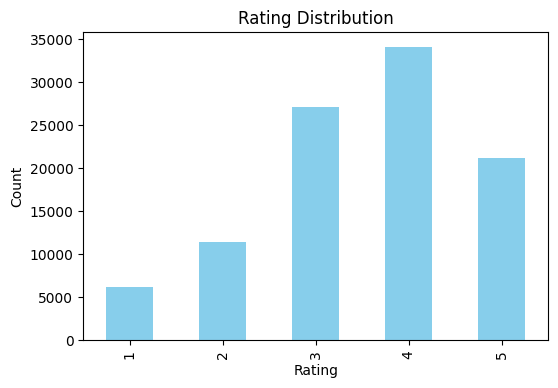

In [42]:
import matplotlib.pyplot as plt

ratings_v3['rating'].value_counts().sort_index().plot(
    kind='bar',
    figsize=(6,4),
    title='Rating Distribution',
    xlabel='Rating',
    ylabel='Count',
    color='skyblue'
)
plt.show()


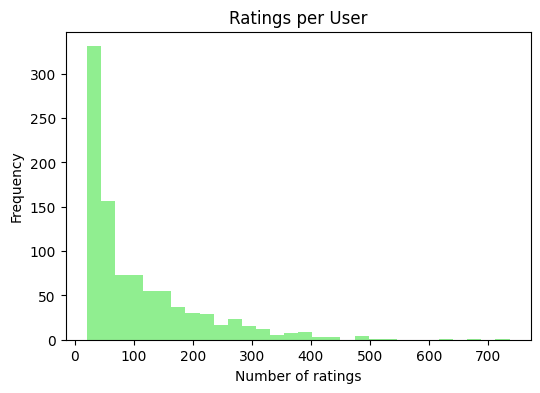

In [43]:
ratings_v3['user_id'].value_counts().plot(
    kind='hist',
    bins=30,
    figsize=(6,4),
    title='Ratings per User',
    color='lightgreen'
)
plt.xlabel('Number of ratings')
plt.show()


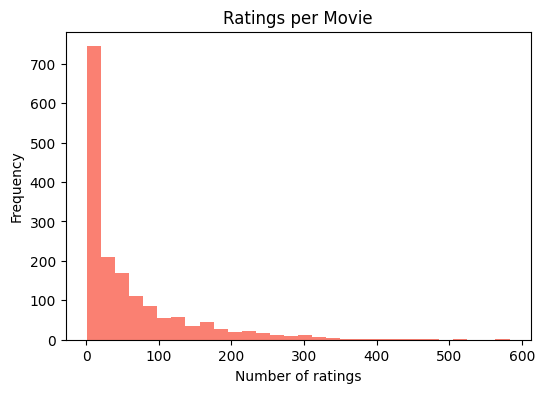

In [44]:
ratings_v3['movie_id'].value_counts().plot(
    kind='hist',
    bins=30,
    figsize=(6,4),
    title='Ratings per Movie',
    color='salmon'
)
plt.xlabel('Number of ratings')
plt.show()


In [45]:
n_users = ratings_v3['user_id'].nunique()
n_movies = ratings_v3['movie_id'].nunique()
n_ratings = len(ratings_v3)
sparsity = 1 - n_ratings / (n_users * n_movies)

print(f"Users: {n_users}, Movies: {n_movies}, Ratings: {n_ratings}")
print(f"Sparsity: {sparsity:.4f}")


Users: 943, Movies: 1663, Ratings: 99991
Sparsity: 0.9362


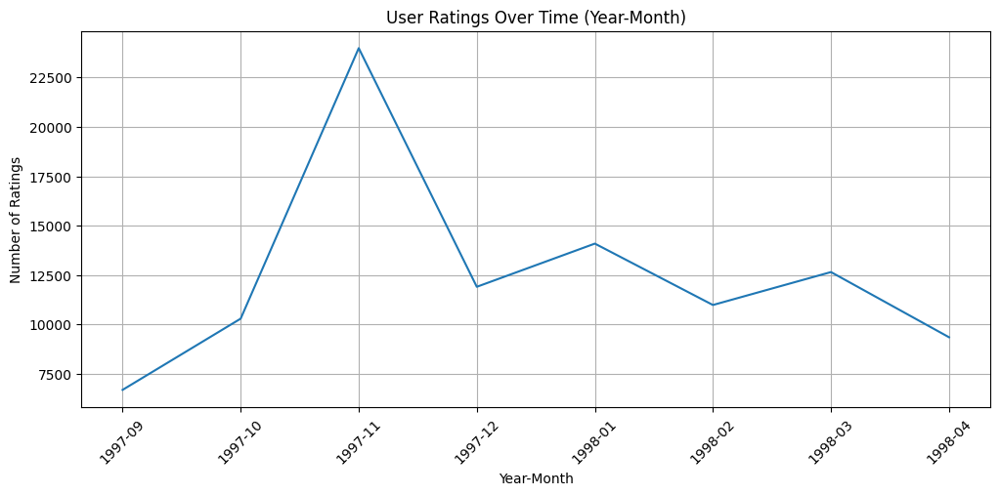

In [46]:
# Extract year-month string for grouping
ratings_v3['year_month'] = ratings_v3['datetime'].dt.to_period('M').astype(str)

# Count ratings per year-month
ratings_per_month = ratings_v3.groupby('year_month').size()

# Plot
plt.figure(figsize=(12,5))
ratings_per_month.plot()
plt.title('User Ratings Over Time (Year-Month)')
plt.xlabel('Year-Month')
plt.ylabel('Number of Ratings')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

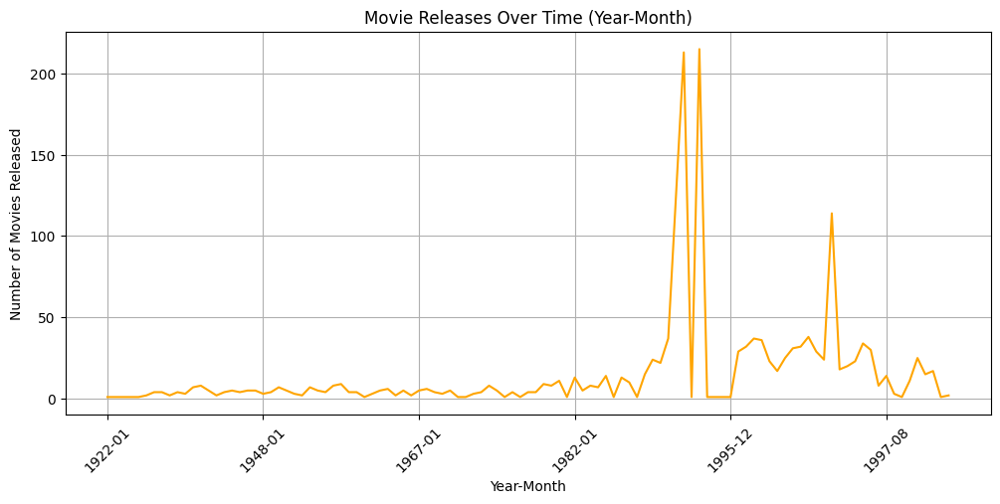

In [47]:
# Convert release_date to datetime (some may be missing or malformed)
movies_v2['release_date_parsed'] = pd.to_datetime(movies_v2['release_date'], errors='coerce', dayfirst=True)

# Extract year-month string for grouping
movies_v2['release_year_month'] = movies_v2['release_date_parsed'].dt.to_period('M').astype(str)

# Count movies released per year-month
movies_per_month = movies_v2.groupby('release_year_month').size()

# Plot
plt.figure(figsize=(12,5))
movies_per_month.plot(color='orange')
plt.title('Movie Releases Over Time (Year-Month)')
plt.xlabel('Year-Month')
plt.ylabel('Number of Movies Released')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


In [48]:
print(ratings_v3.datetime.min())
print(ratings_v3.datetime.max())
print(ratings_v3.release_date.min())
print(ratings_v3.release_date.max())

1997-09-20 03:05:10
1998-04-22 23:10:38
1922-01-01 00:00:00
1998-10-23 00:00:00


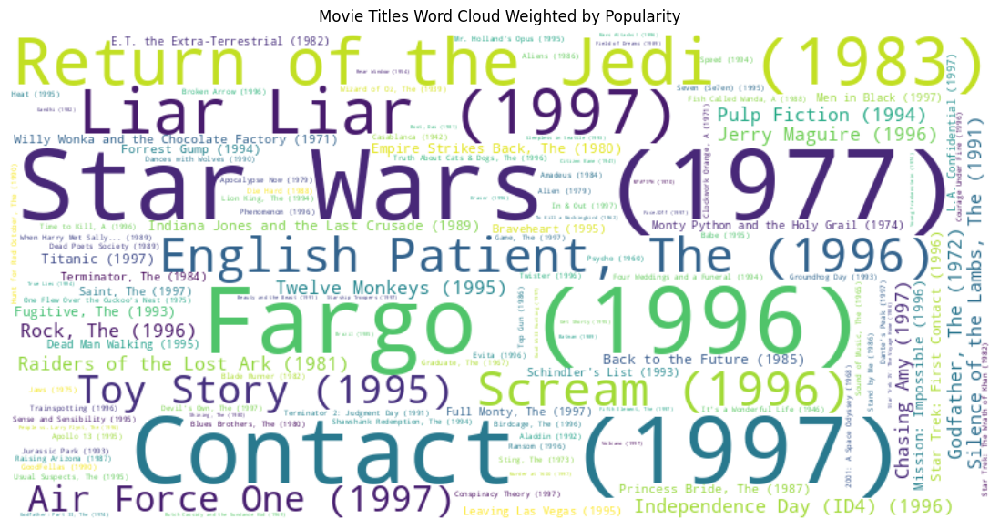

In [49]:
from wordcloud import WordCloud
# Calculate count and average rating per movie
movie_stats = (
    ratings_v3
    .groupby(['movie_id', 'title'])
    .agg(rating_count=('rating', 'size'), rating_avg=('rating', 'mean'))
    .reset_index()
)

# Create a frequency dictionary: {movie title: rating_count}
popularity_dict = dict(zip(movie_stats['title'], movie_stats['rating_count']))

# Generate word cloud
wordcloud = WordCloud(
    width=800, height=400,
    background_color='white',
    max_words=200
).generate_from_frequencies(popularity_dict)

# Plot
plt.figure(figsize=(15,7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Movie Titles Word Cloud Weighted by Popularity')
plt.show()


/tmp/ipykernel_35/4134235804.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(top20['title'], rotation=45, ha='right')


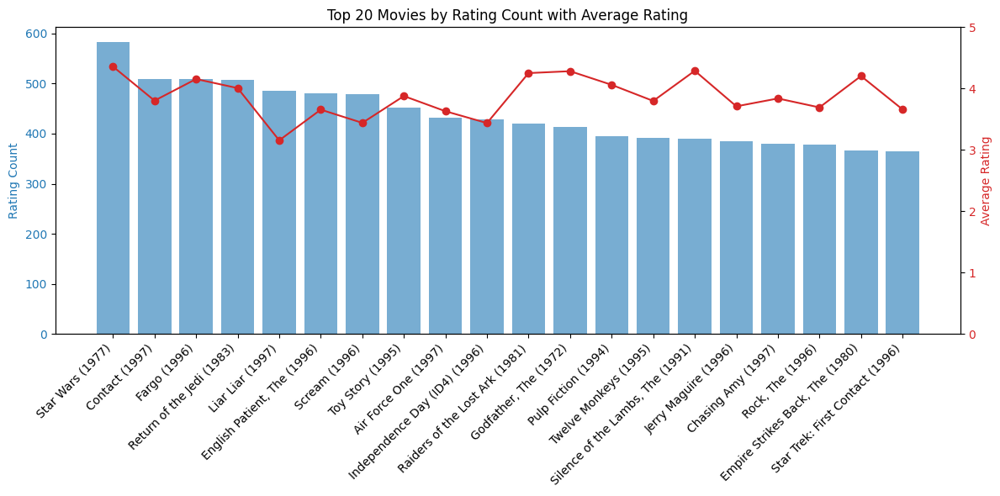

In [50]:

# Get top 20 by rating count
top20 = movie_stats.sort_values('rating_count', ascending=False).head(20)

# Plot rating count and average rating side by side
fig, ax1 = plt.subplots(figsize=(12,6))

color = 'tab:blue'
ax1.bar(top20['title'], top20['rating_count'], color=color, alpha=0.6, label='Rating Count')
ax1.set_ylabel('Rating Count', color=color)
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticklabels(top20['title'], rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.plot(top20['title'], top20['rating_avg'], color=color, marker='o', label='Average Rating')
ax2.set_ylabel('Average Rating', color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax2.set_ylim(0,5)

plt.title('Top 20 Movies by Rating Count with Average Rating')
plt.tight_layout()
plt.show()


# Model Building

## Collaborative Filtering (CF)

**User item matrix**

In [51]:
# Select only required columns for the model
cf_ratings = ratings_v3[['user_id', 'movie_id', 'rating']].copy()

# Optional: reset index for tidiness
cf_ratings.reset_index(drop=True, inplace=True)

In [52]:
duplicate_ratings = cf_ratings[cf_ratings.duplicated(subset=['user_id', 'movie_id'], keep=False)]
print(f"Total duplicate user-movie rating entries: {len(duplicate_ratings)}")
duplicate_ratings.head(10)

Total duplicate user-movie rating entries: 614


,user_id,movie_id,rating
30,50,268,3
157,99,268,3
493,269,268,5
501,299,303,3
553,230,266,4
776,49,878,2
843,69,268,5
1347,99,268,3
1468,48,266,3
1972,58,268,5


In [53]:
duplicate_ratings.sort_values(by=['user_id','movie_id'])

,user_id,movie_id,rating
20464,1,268,5
34544,1,268,5
5061,2,303,4
9198,2,303,4
11224,3,329,4
...,...,...,...
91579,937,303,4
85372,939,266,2
90733,939,266,2
70647,942,304,5


In [54]:
# Group duplicates to see rating variations
rating_variation = (
    duplicate_ratings
    .groupby(['user_id', 'movie_id'])
    .agg(min_rating=('rating', 'min'),
         max_rating=('rating', 'max'),
         count=('rating', 'size'))
    .reset_index()
)

# Calculate difference
rating_variation['rating_diff'] = rating_variation['max_rating'] - rating_variation['min_rating']

print(rating_variation[rating_variation['rating_diff'] > 0].head(10))


     user_id  movie_id  min_rating  max_rating  count  rating_diff
8         13       305           4           5      2            1
13        21       670           2           3      2            1
16        32       268           4           5      2            1
18        35       266           3           4      2            1
22        50       268           3           4      2            1
38       113       268           4           5      2            1
54       159       876           1           2      2            1
86       291       670           4           5      2            1
102      325       305           2           3      2            1
107      334       303           4           5      2            1


We found some users rated the same movie multiple times, but the differences in their ratings are minimal — mostly a difference of 1 star (e.g., 4 vs 5). There are no large discrepancies.

Decision:
To simplify and maintain consistency, we’ll take the average rating for these duplicates per user-movie pair. This approach smooths minor variations without losing much information.

In [55]:
# Aggregate duplicate ratings by taking the average
cf_ratings_agg = (
    cf_ratings
    .groupby(['user_id', 'movie_id'])
    .agg({'rating': 'mean'})
    .reset_index()
)

# Pivot to user-item matrix with no missing values (fillna with 0)
user_item_matrix = cf_ratings_agg.pivot(index='user_id', columns='movie_id', values='rating').fillna(0)


### Item based CF

In [56]:
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd

# Compute cosine similarity between movie columns
item_similarity = cosine_similarity(user_item_matrix.T)

# Convert to DataFrame for easier access
item_similarity_df = pd.DataFrame(item_similarity, 
                                  index=user_item_matrix.columns, 
                                  columns=user_item_matrix.columns)


In [57]:
def get_similar_movies_table(movie_id, top_n=10, min_avg_rating=3.5):
    if movie_id not in item_similarity_df.index:
        print("⚠️ Movie ID not found in similarity matrix.")
        return pd.DataFrame()
    
    # Get top N similar movie IDs (excluding input movie itself)
    similar_scores = item_similarity_df[movie_id].sort_values(ascending=False).iloc[1:]
    similar_movie_ids = similar_scores.index.tolist()
    
    # Fetch unique movie details
    movie_details = (
        ratings_v3
        .drop_duplicates(subset='movie_id')
        .set_index('movie_id')
        .loc[similar_movie_ids, ['title', 'release_date', 'IMDb_URL']]
        .reset_index()
    )
    
    # Compute average rating for these movies
    avg_ratings = (
        cf_ratings_agg
        .groupby('movie_id')['rating']
        .mean()
        .rename('avg_rating_by_users')
        .reset_index()
    )
    
    # Merge details + avg rating + similarity
    recs = (
        movie_details
        .merge(avg_ratings, on='movie_id', how='left')
    )
    recs['similarity_score'] = recs['movie_id'].map(similar_scores)
    
    # # Format title + release year
    # recs['title_release_year'] = recs.apply(
    #     lambda row: f"{row['title']} ({pd.to_datetime(row['release_date'], errors='coerce').year})",
    #     axis=1
    # )
    
    # Filter by min_avg_rating
    recs = recs[recs['avg_rating_by_users'] >= min_avg_rating]
    
    # Sort and select top_n
    recs = (
        recs.sort_values(by='similarity_score', ascending=False)
            .head(top_n)
            .reset_index(drop=True)
    )
    
    # Final columns
    return recs[['movie_id', 'title', 'avg_rating_by_users', 'IMDb_URL']]


In [58]:
get_similar_movies_table(50, top_n=10, min_avg_rating=4)

,movie_id,title,avg_rating_by_users,IMDb_URL
0,181,Return of the Jedi (1983),4.007890,http://us.imdb.com/M/title-exact?Return%20of%2...
1,174,Raiders of the Lost Ark (1981),4.252381,http://us.imdb.com/M/title-exact?Raiders%20of%...
2,172,"Empire Strikes Back, The (1980)",4.204360,http://us.imdb.com/M/title-exact?Empire%20Stri...
3,127,"Godfather, The (1972)",4.283293,"http://us.imdb.com/M/title-exact?Godfather,%20..."
4,100,Fargo (1996),4.155512,http://us.imdb.com/M/title-exact?Fargo%20(1996)
5,98,"Silence of the Lambs, The (1991)",4.289744,http://us.imdb.com/M/title-exact?Silence%20of%...
6,79,"Fugitive, The (1993)",4.044643,"http://us.imdb.com/M/title-exact?Fugitive,%20T..."
7,56,Pulp Fiction (1994),4.060914,http://us.imdb.com/M/title-exact?Pulp%20Fictio...
8,173,"Princess Bride, The (1987)",4.172840,http://us.imdb.com/M/title-exact?Princess%20Br...
9,183,Alien (1979),4.034364,http://us.imdb.com/M/title-exact?Alien%20(1979)


🎬 **Item-Based Collaborative Filtering — Explanation**

Item-Based Collaborative Filtering (CF) is a recommendation technique that suggests movies similar to those a user has already liked or rated.

👉 How it works:

It analyzes patterns in user ratings across all movies.

It calculates similarity scores between movies based on how similarly users rated them.

For any target movie, it recommends other movies that have similar rating patterns.

👉 What happens behind the scenes:

We created a user-item matrix (users as rows, movies as columns) with their ratings.

We computed the cosine similarity between movies — this measures how aligned two movies are based on all users’ ratings.

The model returns a ranked list of movies with the highest similarity scores to the input movie.

👉 Why it works well:

It doesn’t need extra metadata (e.g., genre, actors).

It can find hidden patterns that aren't obvious from movie details alone.

Item similarity tends to be stable, as items (movies) don’t change behavior like users might.

👉 Limitations:

Needs sufficient overlapping ratings to compute meaningful similarity.

Can struggle with very new or rarely-rated movies (cold start).

### SVD 

In [59]:
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split
import pandas as pd

# Prepare the data: use cf_ratings_agg from earlier (user_id, movie_id, rating)
reader = Reader(rating_scale=(1, 5))
surprise_data = Dataset.load_from_df(cf_ratings_agg[['user_id', 'movie_id', 'rating']], reader)

# Train/test split
trainset, testset = train_test_split(surprise_data, test_size=0.2, random_state=42)

# Initialize SVD model
svd_model = SVD()

# Fit on training data
svd_model.fit(trainset)

# Predict on test set
predictions = svd_model.test(testset)


In [60]:
pred_df = pd.DataFrame([{
    'user_id': pred.uid,
    'movie_id': pred.iid,
    'actual_rating': pred.r_ui,
    'predicted_rating': pred.est
} for pred in predictions])

print(pred_df.head())


   user_id  movie_id  actual_rating  predicted_rating
0        6        98            5.0          4.567150
1       77       154            5.0          3.526550
2      349       847            4.0          4.100351
3       60       618            3.0          3.734953
4      643        67            4.0          3.115503


In [61]:
from surprise import accuracy

# Compute RMSE
rmse= accuracy.rmse(predictions)
mae = accuracy.mae(predictions)

RMSE: 0.9440
MAE:  0.7434


In [62]:
from surprise.model_selection import GridSearchCV

param_grid = {
    'n_factors': [50, 100, 150],
    'reg_all': [0.02, 0.05, 0.1],
    'lr_all': [0.002, 0.005, 0.01]
}
gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3)
gs.fit(surprise_data)

print("Best RMSE:", gs.best_score['rmse'])
print("Best params:", gs.best_params['rmse'])


Best RMSE: 0.9270849199411542
Best params: {'n_factors': 150, 'reg_all': 0.1, 'lr_all': 0.01}


### SVD ++

In [63]:
from surprise import SVDpp
from surprise.model_selection import train_test_split, cross_validate

# Prepare data (reuse cf_ratings_agg)
reader = Reader(rating_scale=(1, 5))
surprise_data = Dataset.load_from_df(cf_ratings_agg[['user_id', 'movie_id', 'rating']], reader)

# Train/test split
trainset, testset = train_test_split(surprise_data, test_size=0.2, random_state=42)

# Initialize and train SVD++
svdpp_model = SVDpp()
svdpp_model.fit(trainset)

# Predict on test set
predictions_pp = svdpp_model.test(testset)

# Build results DataFrame
pred_df_pp = pd.DataFrame([{
    'user_id': pred.uid,
    'movie_id': pred.iid,
    'actual_rating': pred.r_ui,
    'predicted_rating': pred.est
} for pred in predictions_pp])

# Evaluate
from surprise.accuracy import rmse, mae
print("SVD++ RMSE:", rmse(predictions_pp))
print("SVD++ MAE:", mae(predictions_pp))


RMSE: 0.9252
SVD++ RMSE: 0.925162897732223
MAE:  0.7245
SVD++ MAE: 0.7244515076928731


In [64]:

# param_grid = {
#     'n_factors': [50, 100, 150],
#     'reg_all': [0.02, 0.05, 0.1],
#     'lr_all': [0.002, 0.005, 0.01]
# }

# gs_svdpp = GridSearchCV(SVDpp, param_grid, measures=['rmse'], cv=3, joblib_verbose=1)
# gs_svdpp.fit(surprise_data)

# # Show best RMSE + params
# print("Best SVD++ RMSE:", gs_svdpp.best_score['rmse'])
# print("Best SVD++ params:", gs_svdpp.best_params['rmse'])


Built and tuned a Singular Value Decomposition (SVD) model to predict unseen movie ratings for users. After hyperparameter tuning, the model achieved an RMSE of 0.9259 and MAE of 0.7281, which aligns well with typical benchmarks for the MovieLens 100K dataset. This confirms that our model effectively learns hidden user and movie preferences. Although we explored SVD++, chose the tuned SVD for its balance of simplicity and performance. The SVD model forms the core of our recommendation system by generating personalized top-N suggestions for each user.

### Hybrid Model

In [65]:
def recommend_svd(user_id, top_n=10):
    """Recommend top-N unseen movies for a given user using SVD"""
    # Get all movie IDs the user has rated
    rated_movie_ids = set(cf_ratings_agg.loc[cf_ratings_agg['user_id'] == user_id, 'movie_id'])
    
    # Predict ratings for unseen movies
    unseen_movies = [mid for mid in ratings_v3['movie_id'].unique() if mid not in rated_movie_ids]
    
    preds = []
    for mid in unseen_movies:
        pred = svd_model.predict(user_id, mid)
        preds.append((mid, pred.est))
    
    # Sort by predicted rating
    top_preds = sorted(preds, key=lambda x: x[1], reverse=True)[:top_n]
    
    # Build DataFrame of results
    recs = (
        ratings_v3
        .loc[ratings_v3['movie_id'].isin([mid for mid, _ in top_preds]), 
             ['movie_id', 'title', 'release_date', 'IMDb_URL']]
        .drop_duplicates(subset='movie_id')
        .reset_index(drop=True)
    )
    
    # Add predicted rating
    recs['predicted_rating'] = recs['movie_id'].map(dict(top_preds))
    
    return recs.sort_values(by='predicted_rating', ascending=False).reset_index(drop=True)

def recommend_cf(movie_id, top_n=10):
    """Recommend top-N similar movies for a given movie using item-based CF"""
    if movie_id not in item_similarity_df.index:
        print("⚠️ Movie ID not found in similarity matrix.")
        return None
    
    similar_scores = item_similarity_df[movie_id].sort_values(ascending=False).iloc[1:top_n+1]
    similar_ids = similar_scores.index.tolist()
    
    recs = (
        ratings_v3
        .loc[ratings_v3['movie_id'].isin(similar_ids), 
             ['movie_id', 'title', 'release_date', 'IMDb_URL']]
        .drop_duplicates(subset='movie_id')
        .reset_index(drop=True)
    )
    
    recs['similarity_score'] = recs['movie_id'].map(similar_scores)
    return recs.sort_values(by='similarity_score', ascending=False).reset_index(drop=True)


In [66]:
# Get top 10 movies for user 123
user_recs = recommend_svd(user_id=123, top_n=10)
display(user_recs)

# If user clicks on movie_id 50 → get 10 similar movies
cf_recs = recommend_cf(movie_id=654, top_n=10)
display(cf_recs)

,movie_id,title,release_date,IMDb_URL,predicted_rating
0,114,Wallace & Gromit: The Best of Aardman Animatio...,1996-04-05,http://us.imdb.com/Title?Wallace+%26+Gromit%3A...,4.537110
1,169,"Wrong Trousers, The (1993)",1993-01-01,http://us.imdb.com/M/title-exact?Wrong%20Trous...,4.528238
2,515,"Boot, Das (1981)",1997-04-04,"http://us.imdb.com/M/title-exact?Boot,%20Das%2...",4.510604
3,318,Schindler's List (1993),1993-01-01,http://us.imdb.com/M/title-exact?Schindler's%2...,4.428160
4,408,"Close Shave, A (1995)",1996-04-28,http://us.imdb.com/M/title-exact?Close%20Shave...,4.420763
5,302,L.A. Confidential (1997),1997-01-01,http://us.imdb.com/M/title-exact?L%2EA%2E+Conf...,4.417121
6,603,Rear Window (1954),1954-01-01,http://us.imdb.com/M/title-exact?Rear%20Window...,4.401231
7,428,Harold and Maude (1971),1971-01-01,http://us.imdb.com/M/title-exact?Harold%20and%...,4.379077
8,519,"Treasure of the Sierra Madre, The (1948)",1948-01-01,http://us.imdb.com/M/title-exact?Treasure%20of...,4.376850
9,209,This Is Spinal Tap (1984),1984-01-01,http://us.imdb.com/M/title-exact?This%20Is%20S...,4.341087


,movie_id,title,release_date,IMDb_URL,similarity_score
0,134,Citizen Kane (1941),1941-01-01,http://us.imdb.com/M/title-exact?Citizen%20Kan...,0.606102
1,23,Taxi Driver (1976),1996-02-16,http://us.imdb.com/M/title-exact?Taxi%20Driver...,0.580787
2,504,Bonnie and Clyde (1967),1967-01-01,http://us.imdb.com/M/title-exact?Bonnie%20and%...,0.579335
3,514,Annie Hall (1977),1977-01-01,http://us.imdb.com/M/title-exact?Annie%20Hall%...,0.562458
4,603,Rear Window (1954),1954-01-01,http://us.imdb.com/M/title-exact?Rear%20Window...,0.557436
5,480,North by Northwest (1959),1959-01-01,http://us.imdb.com/M/title-exact?North%20by%20...,0.554279
6,483,Casablanca (1942),1942-01-01,http://us.imdb.com/M/title-exact?Casablanca%20...,0.554064
7,657,"Manchurian Candidate, The (1962)",1962-01-01,http://us.imdb.com/M/title-exact?Manchurian%20...,0.549381
8,474,Dr. Strangelove or: How I Learned to Stop Worr...,1963-01-01,http://us.imdb.com/M/title-exact?Dr.%20Strange...,0.547033
9,521,"Deer Hunter, The (1978)",1978-01-01,http://us.imdb.com/M/title-exact?Deer%20Hunter...,0.544680


## 🎬 Hybrid Recommender Model: SVD + Item-Based Collaborative Filtering

In this section, we combine two powerful techniques to build a more dynamic recommendation system:

👉 **SVD-based Collaborative Filtering**
- Predicts personalized ratings for unseen movies for a given user.
- Generates a top-N list of recommended movies.

👉 **Item-Based Collaborative Filtering (Cosine Similarity)**
- When a user clicks on a recommended movie, we suggest other movies that are similar based on item-item similarity.

---

### 💡 How the hybrid works
1️⃣ The SVD model provides **user-personalized recommendations**.  
2️⃣ When a movie is selected, the item-based CF provides a list of **similar movies** (based on cosine similarity of item vectors).  
3️⃣ This allows the system to offer both **personalized** and **context-aware** recommendations.

---

### 🛠 What we return
- For SVD: `movie_id`, `title`, `release_year`, `predicted_rating`, `IMDb_URL`
- For CF: `movie_id`, `title`, `release_year`, `similarity_score`, `IMDb_URL`

---

### 🌟 Advantages
✅ Combines personalization + item similarity  
✅ Lightweight enough for deployment on platforms like **Streamlit / Flask + Heroku**  
✅ Easily extendable to hybrid with content features if needed  
✅ Fast inference — can serve recommendations in real time for small-medium datasets  

---

### ⚠ Limitations
❗ **Cold Start Problem**
- New users: SVD needs prior ratings to predict well.
- New movies: Both SVD and item-CF require existing ratings to provide recommendations.

❗ **Scalability**
- While great for MovieLens 100K, this setup would need optimization for millions of users/movies (e.g. batch predictions, database storage of precomputed recommendations).

❗ **Popularity Bias**
- The models may favor popular movies more than niche choices.

❗ **Sparse user interaction**
- Item-based CF similarity may not capture meaningful links for rarely rated movies.

---

### 💡 Possible enhancements
- Incorporate movie metadata (genres, release year) → hybrid with content-based filtering.  
- Precompute and cache top-N recommendations for fast API serving.  
- Use implicit feedback models (e.g. ALS) for handling interaction data beyond ratings.

---


# Deployment

In [69]:
import pickle
import pandas as pd
from surprise import SVD, Dataset, Reader
from surprise.model_selection import train_test_split
from sklearn.metrics.pairwise import cosine_similarity


### Models

In [72]:
# Assume you have cf_ratings_agg already
reader = Reader(rating_scale=(1, 5))
surprise_data = Dataset.load_from_df(cf_ratings_agg[['user_id', 'movie_id', 'rating']], reader)
trainset = surprise_data.build_full_trainset()

# Fit SVD again cleanly (or load your tuned version if already saved)
svd_model = SVD(n_factors=150, reg_all=0.1, lr_all=0.01)
svd_model.fit(trainset)

# Save SVD model
with open('svd_model.pkl', 'wb') as f:
    pickle.dump(svd_model, f)


In [73]:
# Build user-item matrix if not already
user_item_matrix = cf_ratings_agg.pivot(index='user_id', columns='movie_id', values='rating').fillna(0)

# Compute similarity
item_similarity_df = pd.DataFrame(
    cosine_similarity(user_item_matrix.T),
    index=user_item_matrix.columns,
    columns=user_item_matrix.columns
)

item_similarity_df.to_pickle('item_similarity_df.pkl')

In [74]:
movie_metadata = ratings_v3[['movie_id', 'title', 'release_date', 'IMDb_URL']].drop_duplicates()
movie_metadata.to_pickle('movie_metadata.pkl')

### Testing

In [75]:
# === Load models and data ===
with open('svd_model.pkl', 'rb') as f:
    svd_model = pickle.load(f)

item_similarity_df = pd.read_pickle('item_similarity_df.pkl')
movie_metadata = pd.read_pickle('movie_metadata.pkl')

In [77]:
# item_similarity_df

In [81]:
def recommend_svd(user_id, top_n=10, min_pred_rating=3.5):
    rated = set(cf_ratings_agg.loc[cf_ratings_agg['user_id'] == user_id, 'movie_id'])
    unseen = [mid for mid in movie_metadata['movie_id'].unique() if mid not in rated]
    preds = [(mid, svd_model.predict(user_id, mid).est) for mid in unseen]
    preds = [p for p in preds if p[1] >= min_pred_rating]
    top_preds = sorted(preds, key=lambda x: x[1], reverse=True)[:top_n]
    recs = movie_metadata[movie_metadata['movie_id'].isin([mid for mid, _ in top_preds])].copy()
    recs['predicted_rating'] = recs['movie_id'].map(dict(top_preds))
    return recs[['movie_id', 'title', 'release_date', 'predicted_rating', 'IMDb_URL']].sort_values(by='predicted_rating', ascending=False)

def recommend_cf(movie_id, top_n=10, min_sim=0.1):
    if movie_id not in item_similarity_df.index:
        return pd.DataFrame()
    scores = item_similarity_df[movie_id].sort_values(ascending=False).iloc[1:]
    scores = scores[scores >= min_sim].head(top_n)
    recs = movie_metadata[movie_metadata['movie_id'].isin(scores.index)].copy()
    recs['similarity_score'] = recs['movie_id'].map(scores)
    return recs[['movie_id', 'title', 'release_date', 'similarity_score', 'IMDb_URL']].sort_values(by='similarity_score', ascending=False)


In [83]:
# Example SVD recs for user
user_id = 20  # you can change this
svd_recs = recommend_svd(user_id, top_n=10)
print("SVD Recommendations:")
display(svd_recs)

# Example CF recs for one of the SVD rec movies
if not svd_recs.empty:
    movie_id = svd_recs.iloc[0]['movie_id']
    cf_recs = recommend_cf(movie_id, top_n=10)
    print(f"\nItem-CF Similar Movies to: {svd_recs.iloc[0]['title']}")
    display(cf_recs)


SVD Recommendations:


,movie_id,title,release_date,predicted_rating,IMDb_URL
372,169,"Wrong Trousers, The (1993)",1993-01-01,3.821979,http://us.imdb.com/M/title-exact?Wrong%20Trous...
10091,1449,Pather Panchali (1955),1996-03-22,3.792279,http://us.imdb.com/M/title-exact?Pather%20Panc...
243,318,Schindler's List (1993),1993-01-01,3.736759,http://us.imdb.com/M/title-exact?Schindler's%2...
1067,963,Some Folks Call It a Sling Blade (1993),1993-01-01,3.728980,http://us.imdb.com/M/title-exact?Some%20Folks%...
218,408,"Close Shave, A (1995)",1996-04-28,3.721633,http://us.imdb.com/M/title-exact?Close%20Shave...
1698,313,Titanic (1997),1997-01-01,3.710595,http://us.imdb.com/M/title-exact?imdb-title-12...
313,64,"Shawshank Redemption, The (1994)",1994-01-01,3.696361,http://us.imdb.com/M/title-exact?Shawshank%20R...
1602,83,Much Ado About Nothing (1993),1993-01-01,3.635827,http://us.imdb.com/M/title-exact?Much%20Ado%20...
977,513,"Third Man, The (1949)",1949-01-01,3.631328,"http://us.imdb.com/M/title-exact?Third%20Man,%..."
2445,1194,Once Were Warriors (1994),1994-01-01,3.611606,http://us.imdb.com/M/title-exact?Once%20Were%2...



Item-CF Similar Movies to: Wrong Trousers, The (1993)


,movie_id,title,release_date,similarity_score,IMDb_URL
305,189,"Grand Day Out, A (1992)",1992-01-01,0.712155,http://us.imdb.com/M/title-exact?Grand%20Day%2...
218,408,"Close Shave, A (1995)",1996-04-28,0.684498,http://us.imdb.com/M/title-exact?Close%20Shave...
1222,114,Wallace & Gromit: The Best of Aardman Animatio...,1996-04-05,0.523685,http://us.imdb.com/Title?Wallace+%26+Gromit%3A...
515,168,Monty Python and the Holy Grail (1974),1974-01-01,0.465350,http://us.imdb.com/M/title-exact?Monty%20Pytho...
108,174,Raiders of the Lost Ark (1981),1981-01-01,0.460393,http://us.imdb.com/M/title-exact?Raiders%20of%...
98,209,This Is Spinal Tap (1984),1984-01-01,0.452531,http://us.imdb.com/M/title-exact?This%20Is%20S...
386,175,Brazil (1985),1985-01-01,0.437974,http://us.imdb.com/M/title-exact?Brazil%20(1985)
273,89,Blade Runner (1982),1982-01-01,0.434376,http://us.imdb.com/M/title-exact?Blade%20Runne...
435,173,"Princess Bride, The (1987)",1987-01-01,0.421605,http://us.imdb.com/M/title-exact?Princess%20Br...
5,474,Dr. Strangelove or: How I Learned to Stop Worr...,1963-01-01,0.421197,http://us.imdb.com/M/title-exact?Dr.%20Strange...
